# I.Import liberys and import datafiles

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from sklearn.utils import resample
from sklearn.preprocessing import MultiLabelBinarizer, OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import plot_confusion_matrix
import seaborn as sn
from sklearn.metrics import average_precision_score
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import roc_curve, auc
import plotly.express as px


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
import warnings
warnings.filterwarnings('ignore')

 Autheticate E-Mail ID

In [0]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

Get File from Drive using file ID


In [0]:
downloaded = drive.CreateFile({'id':'1lRG7ecxsrAaQlw-I7GlqzlugFbOVR7CD'})
downloaded.GetContentFile('data.csv') 


The collected data from three main sources
A-Customer Trouble tickets
B-network Trouble tickets
C-system logs&alarms


The data collection and aggregation was done using SQL 

**Our main objective is to find a classification model that predicts wither a network fault would happen or not on the customer level**

In [5]:
datafile = pd.read_csv('data.csv') 
datafile.head()

,Cust_ID,TIME_T_M,F-38/1,F-38/15,F-38/4,F-38/12,F-38/6,F-38/10,UPLOAD_MB,UPLOAD_MB_AVG,UPLOAD_MB_MAX,UPLOAD_MB_MIN,UPLOAD_MB_STDDEF,UPLOAD_MB_VAR,DOWNLOAD_MB,DOWNLOAD_MB_DW,DOWNLOAD_MB_MAX,DOWNLOAD_MB_MIN,DOWNLOAD_MB_STDDEF,DOWNLOAD_MB_VAR,SESSION_COUNTS,TERMINATE_SESSION_MINT,CURR_ATTAIN_DS_AVG,CURR_ATTAIN_DS_STDEV,CURR_ATTAIN_DS_MAX,CUR_ATTAIN_DS_MIN,CURR_ATTAIN_US_AVG,CURR_ATTAIN_US_STDEV,CUR_ATTAIN_US_MIN,FL_RESOULTION,NUMBER_FAULTS,FAULT_OR_NOT,BANDWIDTH,type port
0,ID-1,2.834,10,0,2,0,0,0,326.55,40.82,64.75,21.97,13.59,184.78,4399.69,549.96,1027.56,106.78,320.49,102711.84,12,151.34,126.60,1.29,129.95,124.77,9.63,4.82,6.49,NaN,NaN,Non_Fault,30.0,VDSL
1,ID-2,0.331,1,0,0,0,0,0,1622.45,202.81,280.69,139.15,56.39,3179.99,37597.96,4699.75,7127.17,2334.55,1398.94,1957040.32,1,136.23,10.65,0.54,11.58,9.92,1.10,0.07,0.99,NaN,NaN,Non_Fault,4.0,VDSL
2,ID-3,0.275,3,2,0,0,0,0,4244.14,530.52,669.68,368.88,100.77,10155.04,79366.31,9920.79,14229.02,6569.37,2702.92,7305779.04,7,2.86,26.45,0.17,26.70,26.21,1.22,0.01,1.21,NaN,NaN,Non_Fault,16.0,VDSL
3,ID-4,2.318,7,0,0,0,0,0,503.30,62.91,115.51,40.18,27.99,783.45,8097.08,1012.14,1859.06,316.09,629.18,395861.53,8,725.92,19.83,0.13,20.08,19.63,1.07,0.01,1.05,NaN,NaN,Non_Fault,8.0,VDSL
4,ID-5,0.186,0,0,0,3,0,0,3291.18,411.40,1160.35,220.88,309.72,95929.49,58210.70,7276.34,11034.58,2565.87,2710.66,7347668.92,3,1.11,22.08,0.89,23.95,20.44,1.29,0.00,1.29,NaN,NaN,Non_Fault,24.0,VDSL


## II-data analysis and exploration 


**In this section we implemnted some basic analysis on the data and some visulasation and data munging**

# 1- 5 number summery




In [6]:
datafile.describe().T

,count,mean,std,min,25%,50%,75%,max
TIME_T_M,213177.0,9.884683e-01,3.115792e+00,0.00,0.331,0.61,1.129000e+00,4.799100e+02
F-38/1,213177.0,5.954170e+00,1.634075e+01,0.00,2.000,3.00,7.000000e+00,2.151000e+03
F-38/15,213177.0,3.903367e+00,4.634813e+01,0.00,0.000,0.00,1.000000e+00,7.306000e+03
F-38/4,213177.0,3.108037e+00,2.471644e+01,0.00,0.000,0.00,0.000000e+00,5.108000e+03
F-38/12,213177.0,2.702637e-01,4.191371e+00,0.00,0.000,0.00,0.000000e+00,1.124000e+03
F-38/6,213177.0,7.910797e-02,3.144352e+00,0.00,0.000,0.00,0.000000e+00,9.280000e+02
F-38/10,213177.0,7.428569e-02,3.907161e+00,0.00,0.000,0.00,0.000000e+00,1.318000e+03
UPLOAD_MB,213177.0,4.499827e+03,4.071405e+03,0.00,2022.630,3758.23,5.992700e+03,2.357750e+05
UPLOAD_MB_AVG,213177.0,5.648459e+02,5.086893e+02,0.00,255.410,471.71,7.505400e+02,2.947187e+04
UPLOAD_MB_MAX,213177.0,9.275335e+02,8.785023e+02,0.00,415.150,727.51,1.172360e+03,3.045619e+04


# 2- type of data in each column

In [7]:
datafile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 213177 entries, 0 to 213176
Data columns (total 34 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Cust_ID                 213177 non-null  object 
 1   TIME_T_M                213177 non-null  float64
 2   F-38/1                  213177 non-null  int64  
 3   F-38/15                 213177 non-null  int64  
 4   F-38/4                  213177 non-null  int64  
 5   F-38/12                 213177 non-null  int64  
 6   F-38/6                  213177 non-null  int64  
 7   F-38/10                 213177 non-null  int64  
 8   UPLOAD_MB               213177 non-null  float64
 9   UPLOAD_MB_AVG           213177 non-null  float64
 10  UPLOAD_MB_MAX           213177 non-null  float64
 11  UPLOAD_MB_MIN           213177 non-null  float64
 12  UPLOAD_MB_STDDEF        213177 non-null  float64
 13  UPLOAD_MB_VAR           213177 non-null  float64
 14  DOWNLOAD_MB         

from the above table we noticed the following:


1.   Total row number 213177
2.   Total features 33(excluding Customer ID)
3.   Total categorical features=3
4.   Total numrical features=30
5.   features with null values = 3



# 3- Null values check

In [8]:
datafile.isnull().sum()

Cust_ID                        0
TIME_T_M                       0
F-38/1                         0
F-38/15                        0
F-38/4                         0
F-38/12                        0
F-38/6                         0
F-38/10                        0
UPLOAD_MB                      0
UPLOAD_MB_AVG                  0
UPLOAD_MB_MAX                  0
UPLOAD_MB_MIN                  0
UPLOAD_MB_STDDEF               0
UPLOAD_MB_VAR                  0
DOWNLOAD_MB                    0
DOWNLOAD_MB_DW                 0
DOWNLOAD_MB_MAX                0
DOWNLOAD_MB_MIN                0
DOWNLOAD_MB_STDDEF             0
DOWNLOAD_MB_VAR                0
SESSION_COUNTS                 0
TERMINATE_SESSION_MINT         0
CURR_ATTAIN_DS_AVG             0
CURR_ATTAIN_DS_STDEV           0
CURR_ATTAIN_DS_MAX             0
CUR_ATTAIN_DS_MIN              0
CURR_ATTAIN_US_AVG             0
CURR_ATTAIN_US_STDEV           0
CUR_ATTAIN_US_MIN              0
FL_RESOULTION             205742
NUMBER_FAU

it seems that type port has some missing values and needs to be dealt with. However, FL_resolution and number_faults have large missing values, but the variables indicate if the customer had faults in the period after analysis or not, so missing data indicates that customer didn't have any network faults.

# 4-check if there is dublication of data 

In [9]:
df_duplicates = datafile.duplicated()
print ('Number of duplicate entries is/are {}'.format(df_duplicates.sum()))

Number of duplicate entries is/are 0


# 5-check the unique values

In [10]:
datafile.select_dtypes(include = ['object']).nunique()

Cust_ID          213177
FL_RESOULTION         7
FAULT_OR_NOT          2
type port             2
dtype: int64

# 6-Check and remove negative values (system calculation errors)

(array([7.0000e+00, 9.0000e+00, 1.3000e+01, 4.2000e+01, 5.0800e+02,
        1.8639e+04, 1.0969e+04, 7.9720e+03, 6.2520e+03, 4.9650e+03]),
 array([-5, -4, -3, -2, -1,  0,  1,  2,  3,  4,  5]),
 <a list of 10 Patch objects>)

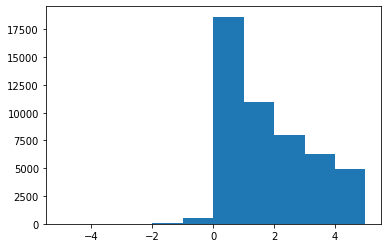

In [11]:
plt.hist(datafile['TERMINATE_SESSION_MINT'],bins=[-5,-4,-3,-2,-1,0,1,2,3,4,5])

In [12]:
datafile=datafile[datafile['TERMINATE_SESSION_MINT']>=0]
datafile.describe().T

,count,mean,std,min,25%,50%,75%,max
TIME_T_M,211623.0,9.884453e-01,3.103967e+00,0.00,0.331,0.611,1.129000e+00,4.799100e+02
F-38/1,211623.0,5.949169e+00,1.633144e+01,0.00,2.000,3.000,7.000000e+00,2.151000e+03
F-38/15,211623.0,3.885589e+00,4.601023e+01,0.00,0.000,0.000,1.000000e+00,7.306000e+03
F-38/4,211623.0,3.096748e+00,2.475935e+01,0.00,0.000,0.000,0.000000e+00,5.108000e+03
F-38/12,211623.0,2.695028e-01,4.204010e+00,0.00,0.000,0.000,0.000000e+00,1.124000e+03
F-38/6,211623.0,7.896117e-02,3.149998e+00,0.00,0.000,0.000,0.000000e+00,9.280000e+02
F-38/10,211623.0,7.369237e-02,3.919146e+00,0.00,0.000,0.000,0.000000e+00,1.318000e+03
UPLOAD_MB,211623.0,4.495721e+03,4.043072e+03,0.00,2023.225,3757.720,5.990635e+03,2.357750e+05
UPLOAD_MB_AVG,211623.0,5.643262e+02,5.051506e+02,0.00,255.445,471.650,7.502450e+02,2.947187e+04
UPLOAD_MB_MAX,211623.0,9.265796e+02,8.728579e+02,0.00,415.170,727.340,1.171885e+03,3.045619e+04


## 7-separate the data file based on type

In [0]:
num_data= datafile.select_dtypes(['int','float','int64','float64'])
cat_data=datafile.select_dtypes(include = ['object'])

## 8-Encoding FAULT_OR_NOT and type port columns to 0 and 1 so we can graph it  
## Faults=1 or Non_Fault=0
## ADSL=1 or VDSL=0

In [0]:
def encod_fon(x):
  if x =='Faults':
    return 1
  if x == 'Non_Fault':
    return 0
  if x=='ADSL':
    return 1
  if x=='VDSL':
    return 0


In [0]:
num_data['Enc_FaultorNot']=datafile['FAULT_OR_NOT'].apply(encod_fon).astype(int)
num_data['enc_type_port']=datafile['type port'].apply(encod_fon)
cat_data.drop(columns={'FAULT_OR_NOT'},inplace=True)
cat_data.drop(columns={'type port'},inplace=True)

### III-visualization 

1- we need to visualize the percentage of FAULTS to FAULT_OR_NOT

In [16]:
num_data['Enc_FaultorNot'].value_counts()

0    204235
1      7388
Name: Enc_FaultorNot, dtype: int64

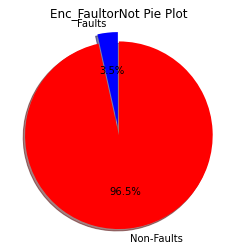

In [17]:
labels = 'Faults', 'Non-Faults'
sizes = [num_data.Enc_FaultorNot[num_data['Enc_FaultorNot']==1].count(), num_data.Enc_FaultorNot[num_data['Enc_FaultorNot']==0].count()]
explode = (0, 0.1)
fig1, ax1 = plt.subplots(figsize=(4,4))
ax1.pie(sizes, explode=explode, labels=labels,colors=['Blue','Red'], autopct='%1.1f%%',shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Enc_FaultorNot Pie Plot")
plt.show()

2-the relashinship between Bandwidth (Speed) with Faults

Text(0.5, 1.0, 'Distribution of Faults per Bandwith')

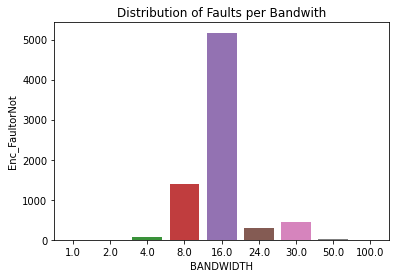

In [18]:
gp_by= pd.DataFrame(num_data[num_data['Enc_FaultorNot']==1].groupby('BANDWIDTH')['Enc_FaultorNot'].sum())
my_plot = sn.barplot(x=gp_by.index, y=gp_by['Enc_FaultorNot'])
plt.title('Distribution of Faults per Bandwith')


In [19]:
num_data['BANDWIDTH'].value_counts()

16.0     161268
8.0       25851
24.0      11171
30.0      10878
4.0         865
50.0        819
2.0         421
1.0         234
100.0        89
0.5          11
12.0          9
6.0           7
Name: BANDWIDTH, dtype: int64

apparently, customers on Bandwidth 16 have the largest faults, but bandwidth 16 have the largest amount of customers, so it makes sense.

In [20]:
#plot upload atribut
num_data.loc[:,:]
uploadplt=num_data.loc[:, 'UPLOAD_MB':'UPLOAD_MB_STDDEF']
list(uploadplt.columns)

['UPLOAD_MB',
 'UPLOAD_MB_AVG',
 'UPLOAD_MB_MAX',
 'UPLOAD_MB_MIN',
 'UPLOAD_MB_STDDEF']

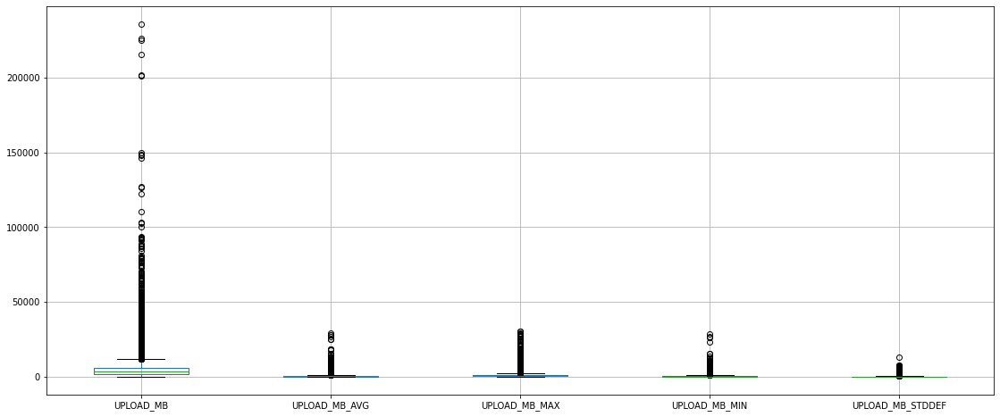

In [21]:
fig = plt.figure(1, figsize=(19, 8))

ax = fig.add_subplot(111)
#boxplot = num_data.boxplot(column=['UPLOAD_MB', 'UPLOAD_MB_AVG', 'UPLOAD_MB_MAX', 'UPLOAD_MB_MIN','UPLOAD_MB_STDDEF'])
boxplot = num_data.boxplot(column=list(uploadplt.columns))

In [0]:
#plot download atribut
num_data.loc[:,:]
downloadplt=num_data.loc[:,'DOWNLOAD_MB':'DOWNLOAD_MB_STDDEF']

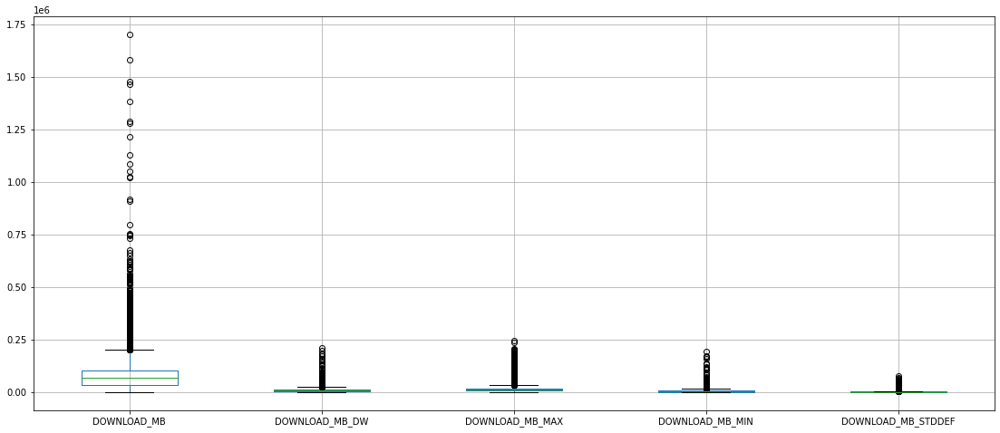

In [23]:
fig = plt.figure(1, figsize=(19, 8))

ax = fig.add_subplot(111)
boxplot = num_data.boxplot(column=list(downloadplt.columns))

In [0]:
# scatter plot matrix 

In [25]:
num_data.columns

Index(['TIME_T_M', 'F-38/1', 'F-38/15', 'F-38/4', 'F-38/12', 'F-38/6',
       'F-38/10', 'UPLOAD_MB', 'UPLOAD_MB_AVG', 'UPLOAD_MB_MAX',
       'UPLOAD_MB_MIN', 'UPLOAD_MB_STDDEF', 'UPLOAD_MB_VAR', 'DOWNLOAD_MB',
       'DOWNLOAD_MB_DW', 'DOWNLOAD_MB_MAX', 'DOWNLOAD_MB_MIN',
       'DOWNLOAD_MB_STDDEF', 'DOWNLOAD_MB_VAR', 'SESSION_COUNTS',
       'TERMINATE_SESSION_MINT', 'CURR_ATTAIN_DS_AVG', 'CURR_ATTAIN_DS_STDEV',
       'CURR_ATTAIN_DS_MAX', 'CUR_ATTAIN_DS_MIN', 'CURR_ATTAIN_US_AVG',
       'CURR_ATTAIN_US_STDEV', 'CUR_ATTAIN_US_MIN', 'NUMBER_FAULTS',
       'BANDWIDTH', 'Enc_FaultorNot', 'enc_type_port'],
      dtype='object')

In [0]:
scaterrplotdata=num_data[['TIME_T_M', 'F-38/1', 'F-38/15', 'F-38/4', 'F-38/12', 'F-38/6',
       'F-38/10','CURR_ATTAIN_DS_AVG','TERMINATE_SESSION_MINT','DOWNLOAD_MB','UPLOAD_MB']]

In [27]:
fig = px.scatter_matrix(scaterrplotdata,width=1200,height=800)

fig.show()

## Assessing Missing Values per Column

since the missing value are associated with Non fault raws we need to replace these missing values with new value 

In [0]:
cat_data['FL_RESOULTION'].fillna("No Faults", inplace = True) 


Dropping customer ID

In [0]:
cat_data.drop(columns={'Cust_ID'},inplace=True)

In [0]:
# 3- dealing with missing values for num_data

In [31]:
num_data.isnull().sum()

TIME_T_M                       0
F-38/1                         0
F-38/15                        0
F-38/4                         0
F-38/12                        0
F-38/6                         0
F-38/10                        0
UPLOAD_MB                      0
UPLOAD_MB_AVG                  0
UPLOAD_MB_MAX                  0
UPLOAD_MB_MIN                  0
UPLOAD_MB_STDDEF               0
UPLOAD_MB_VAR                  0
DOWNLOAD_MB                    0
DOWNLOAD_MB_DW                 0
DOWNLOAD_MB_MAX                0
DOWNLOAD_MB_MIN                0
DOWNLOAD_MB_STDDEF             0
DOWNLOAD_MB_VAR                0
SESSION_COUNTS                 0
TERMINATE_SESSION_MINT         0
CURR_ATTAIN_DS_AVG             0
CURR_ATTAIN_DS_STDEV           0
CURR_ATTAIN_DS_MAX             0
CUR_ATTAIN_DS_MIN              0
CURR_ATTAIN_US_AVG             0
CURR_ATTAIN_US_STDEV           0
CUR_ATTAIN_US_MIN              0
NUMBER_FAULTS             204235
BANDWIDTH                      0
Enc_Faulto

missing values in number_faults indicate that customer didn't have any faults, so we're replacing it with 0

In [0]:
num_data['NUMBER_FAULTS'].fillna(0,inplace = True)

missing data in enc_type_port do not indicate anything, so it needs to be filled. we used most frequent strategy because data is binary and the feature indicates the type of port (ADSL,VDSL)

In [0]:
imp=SimpleImputer(strategy='most_frequent')
imp.fit(num_data[['enc_type_port']])
num_data['enc_type_port']=imp.transform(num_data[['enc_type_port']])


In [34]:
num_data.isnull().sum()

TIME_T_M                  0
F-38/1                    0
F-38/15                   0
F-38/4                    0
F-38/12                   0
F-38/6                    0
F-38/10                   0
UPLOAD_MB                 0
UPLOAD_MB_AVG             0
UPLOAD_MB_MAX             0
UPLOAD_MB_MIN             0
UPLOAD_MB_STDDEF          0
UPLOAD_MB_VAR             0
DOWNLOAD_MB               0
DOWNLOAD_MB_DW            0
DOWNLOAD_MB_MAX           0
DOWNLOAD_MB_MIN           0
DOWNLOAD_MB_STDDEF        0
DOWNLOAD_MB_VAR           0
SESSION_COUNTS            0
TERMINATE_SESSION_MINT    0
CURR_ATTAIN_DS_AVG        0
CURR_ATTAIN_DS_STDEV      0
CURR_ATTAIN_DS_MAX        0
CUR_ATTAIN_DS_MIN         0
CURR_ATTAIN_US_AVG        0
CURR_ATTAIN_US_STDEV      0
CUR_ATTAIN_US_MIN         0
NUMBER_FAULTS             0
BANDWIDTH                 0
Enc_FaultorNot            0
enc_type_port             0
dtype: int64

In [0]:
# concatinat num data and cat data 

In [0]:
cleaned_df = pd.concat([num_data,cat_data],axis=1)


Checking Correlation Matrix for Correlation between variables

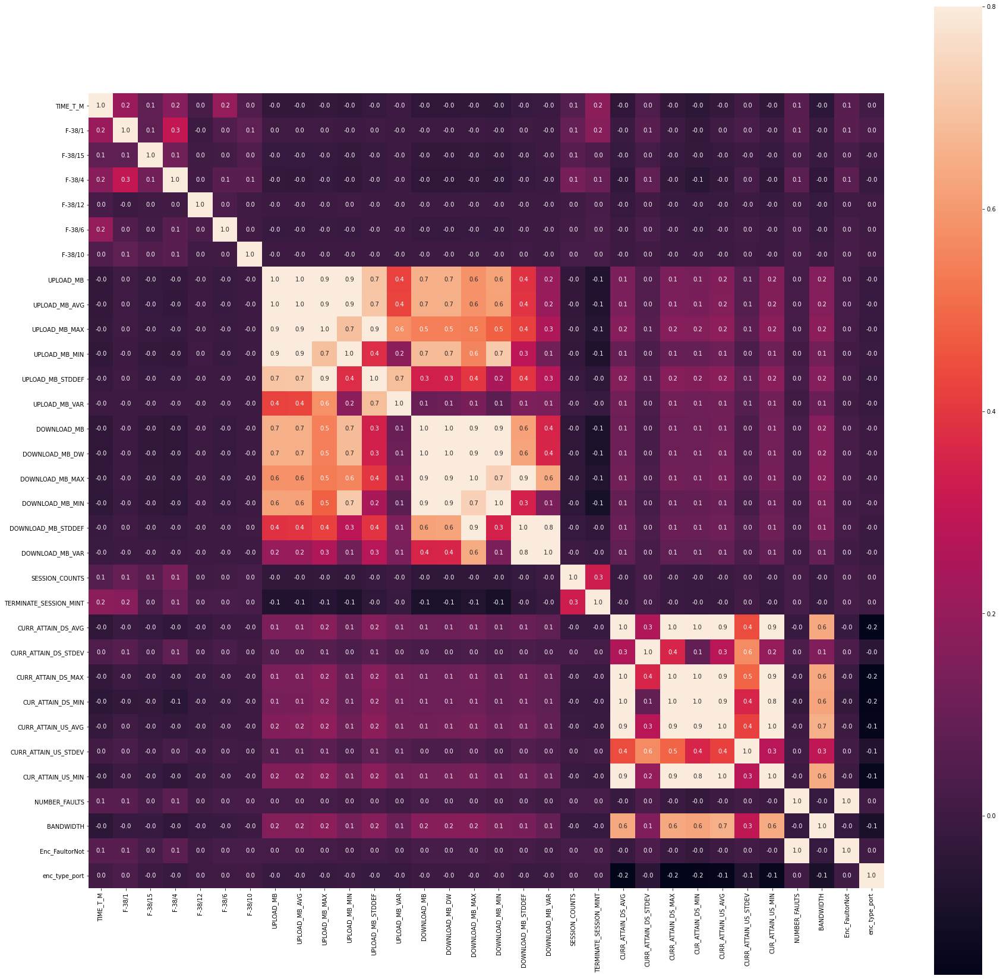

In [37]:
correlationmat = cleaned_df.corr(method='pearson')
f, ax = plt.subplots(figsize = (30,30))
sn.heatmap(correlationmat, vmax=0.8, square=True, annot=True,fmt='0.01f')

it seems that there are some variables that have high correlation with each other, so variables with correlation coefficient above 0.8 or below -0.8 should be removed (one of them not both)

In [0]:
data_to_clean=cleaned_df.drop('Enc_FaultorNot',axis=1)
corr_matrix = data_to_clean.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]
cleaned_df.drop(to_drop, axis=1, inplace=True)


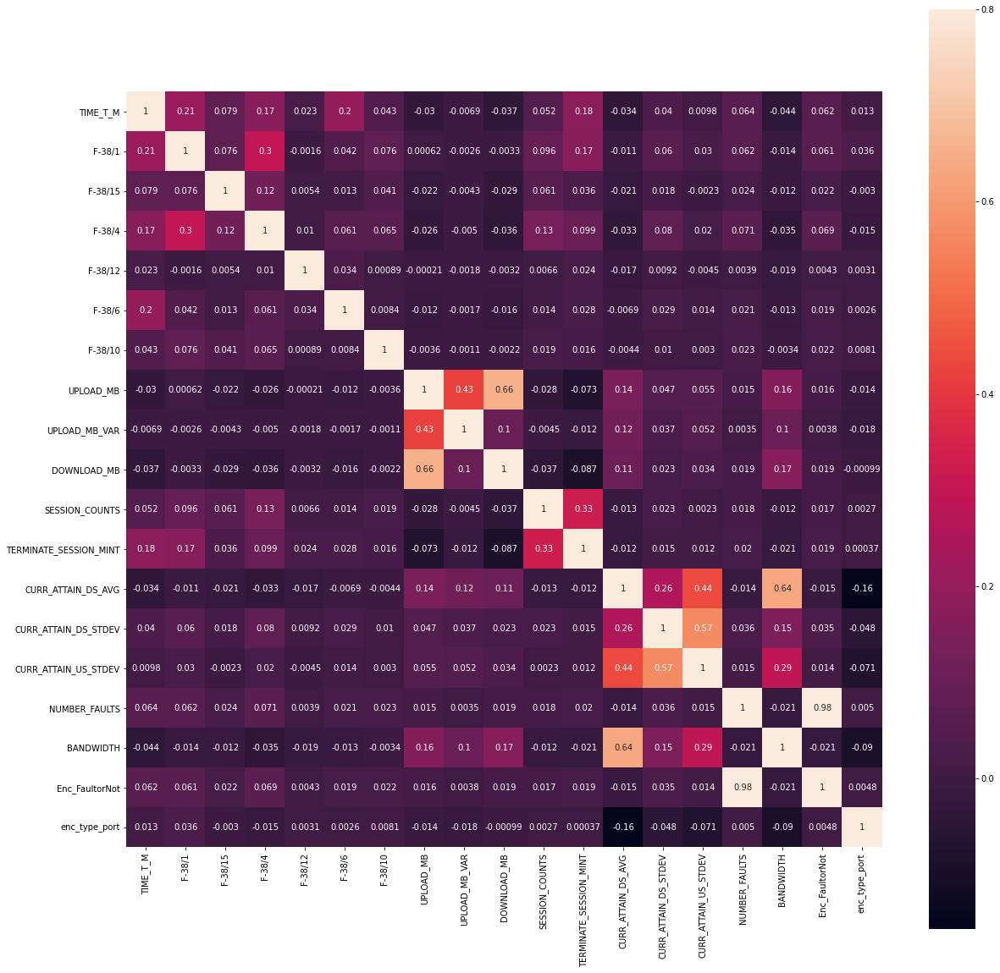

In [39]:
correlationmat = cleaned_df.corr(method='pearson')
f, ax = plt.subplots(figsize = (20,20))
sn.heatmap(correlationmat, vmax=0.8, square=True, annot=True);

due to imbalance in data and since the ration between faults to non-faults is 3.5/96.5 we need to Downsample the date and after many trail we figure out that the best ratio is 40% non-fault to 60% faults 

In [0]:
data_majority = cleaned_df[cleaned_df.Enc_FaultorNot==0]
data_minority = cleaned_df[cleaned_df.Enc_FaultorNot==1]


df_majority_downsampled = resample(data_majority,n_samples=np.int(data_minority.shape[0]*0.4/0.6),replace=False,random_state=123)

data_downsampled = pd.concat([data_minority, df_majority_downsampled])

## IV.Train/Test

**choosing the dependet variable and independent variable **

In [0]:
x = data_downsampled.drop(["Enc_FaultorNot","FL_RESOULTION"],axis=1)
y = data_downsampled['Enc_FaultorNot']
X_train, X_test, y_train, y_test = train_test_split(x, y, train_size=0.80)

In [0]:
# Setting this option to None to suppress a warning that we don't need to worry about right now
pd.options.mode.chained_assignment = None

In [43]:
X_train.isnull().sum()

TIME_T_M                  0
F-38/1                    0
F-38/15                   0
F-38/4                    0
F-38/12                   0
F-38/6                    0
F-38/10                   0
UPLOAD_MB                 0
UPLOAD_MB_VAR             0
DOWNLOAD_MB               0
SESSION_COUNTS            0
TERMINATE_SESSION_MINT    0
CURR_ATTAIN_DS_AVG        0
CURR_ATTAIN_DS_STDEV      0
CURR_ATTAIN_US_STDEV      0
NUMBER_FAULTS             0
BANDWIDTH                 0
enc_type_port             0
dtype: int64

## A-transform the data for num data

In [0]:
# **Transforming Numerical Data - Standardization**

In [0]:
temp_df = X_train.select_dtypes(['int','int64','float64','float'])
bi_cols = []
for col in temp_df.columns:
    if temp_df[col].nunique() == 2:
        bi_cols.append(col)

In [46]:
temp_df.isnull().sum()

TIME_T_M                  0
F-38/1                    0
F-38/15                   0
F-38/4                    0
F-38/12                   0
F-38/6                    0
F-38/10                   0
UPLOAD_MB                 0
UPLOAD_MB_VAR             0
DOWNLOAD_MB               0
SESSION_COUNTS            0
TERMINATE_SESSION_MINT    0
CURR_ATTAIN_DS_AVG        0
CURR_ATTAIN_DS_STDEV      0
CURR_ATTAIN_US_STDEV      0
NUMBER_FAULTS             0
BANDWIDTH                 0
enc_type_port             0
dtype: int64

In [0]:
cols_to_standardize = np.setdiff1d(temp_df.columns,temp_df[bi_cols].columns)

In [0]:
scaler = StandardScaler(with_mean=False, with_std=False)
scaler.fit(X_train[cols_to_standardize])

X_train[cols_to_standardize] = scaler.transform(X_train[cols_to_standardize])
X_test[cols_to_standardize] = scaler.transform(X_test[cols_to_standardize])

In [49]:
X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
TIME_T_M,9850.0,1.601552,7.718964,0.008,0.3510,0.722,1.4300,479.91
F-38/1,9850.0,9.015431,24.037672,0.000,2.0000,4.000,8.0000,645.00
F-38/15,9850.0,7.980914,75.036047,0.000,0.0000,0.000,2.0000,4281.00
F-38/4,9850.0,8.195127,39.603919,0.000,0.0000,0.000,1.0000,1377.00
F-38/12,9850.0,0.291574,2.579443,0.000,0.0000,0.000,0.0000,174.00
F-38/6,9850.0,0.240914,2.921265,0.000,0.0000,0.000,0.0000,113.00
F-38/10,9850.0,0.353503,13.966581,0.000,0.0000,0.000,0.0000,1318.00
UPLOAD_MB,9850.0,4640.286643,3717.733235,0.000,2231.6425,3954.610,6112.3250,64272.55
UPLOAD_MB_VAR,9850.0,105881.013281,636486.622690,0.000,7607.0875,21337.060,62402.9450,40170201.46
DOWNLOAD_MB,9850.0,77954.127323,51419.611023,0.000,40862.1125,70643.885,105622.0525,539925.98


## Modling

Since our proplem is a classification proplem we tested multiple algorathims and evaluate each one of them to decide the best one 

In [0]:
models = []
models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('NB', GaussianNB()))
models.append(('LSVC', LinearSVC()))
models.append(('SGD', SGDClassifier()))


In [53]:
# We calculated several evaluation techniques (Confusion Matrix, Average Accuracy, PRC Curve, AUC Curve)

results = []
names = []
precisions=[]
auc_scores=[]
i=0
fig, axs = plt.subplots(len(models), 3)
fig.set_figheight(400)
fig.set_figwidth(400)
for name, model in models:
    kfold = KFold(n_splits=10, random_state='seed')
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold)
    results.append(cv_results)
    names.append(name)
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    cm=confusion_matrix(y_test,y_pred)
    plt.title(name)   
    sn.set(font_scale=10)
    sn.heatmap(cm,annot=True,ax=axs[i,0],cmap='Blues',xticklabels=['Pred_No Fault','Pred_Fault'],yticklabels=['Act_No Fault','Act_Fault'],fmt="1.0f")
            
    avg_prcn=average_precision_score(y_test,y_pred)
    precisions.append(avg_prcn) 
    disp=plot_precision_recall_curve(model,X_test,y_test,ax=axs[i,1],color='Black',lw=10)
    disp.ax_.set_title('PRC Curve for: '+model.__class__.__name__)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    auc_scores.append(roc_auc)
    axs[i,2].set_label('AUC= %d' % roc_auc)
    axs[i,2].set(xlabel='False Positive Rate',ylabel='True Positive Rate')
    axs[i,2].set(title='ROC Curve for: '+ model.__class__.__name__)
    axs[i,2].plot(fpr, tpr, color='Black',lw=10,label=('AUC= %d' % roc_auc))
    axs[i,2].plot([0, 1], [0, 1], color='red', lw=10, linestyle='--',label='Line')
    axs[i,2].legend('AUC= %d' % roc_auc,"Line")
    i=i+1
    print('modle name',name,'cross valdiation score',cv_results.mean(),', AUC=',roc_auc)



modle name LR cross valdiation score 0.6025380710659898 , AUC= 0.4996584699453552
modle name KNN cross valdiation score 0.5498477157360406 , AUC= 0.5032563301005923
modle name NB cross valdiation score 0.48974619289340093 , AUC= 0.5444717258241848
modle name LSVC cross valdiation score 0.8205076142131981 , AUC= 0.85519535929372
modle name SGD cross valdiation score 0.5150253807106598 , AUC= 0.48229274356323537


In [0]:
auc_scores

After testing the mentioned model, and review the evaluation methods above, it seems that **Linear SVC** provides the best perdformance in terms of accuracy (checked through average accuracy score and confusion matrix), PRC curve and Average Precision, and AUC curve. The performance metrics are: Accuracy (~0.8), Precision (0.79), AUC (0.83). 

The model can be tuned and improved by many methods:


1.   Add new features (due to approval routines at the company, we couldn't add some features that are more technical related, which might increase the performance according to recent related research in this field)
2.   Apply some optimization techniques like optimizing hyperparameters of the algorithm, or by using other algorithms kike SGD to optimize the cost function of linear SVC
3.   To try more complex algorithms and observe the results
4.   finally, the model can be improved to predict if customer would experience a fault or not, and what is the type of fault he will experience. This might be done by applying cascaded models

